# TMDB Movie Database - Analysis 
### Project Hypothesis : Budget spent on movies And Revenue generated have increased considerably over time are in positive correlation with one another.

## Project Outlines and Steps Followed :      
    * Gathering data from provided CSV.
    * Data Cleaning and Engineering using Python on Google Colab.
    * Dropping Un-neccesary Columns and Dividing columns with heterogeneous data into new individual columns.  
    * Following our hypothesis. I have further plotted graphs and have mentioned key take aways from each one of them as we move along this project.
    * Python Scripts with Concludding graphs can be easily found below. 


### Importing Required Library and provided DB : TMDB database (CSV file)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
figure(figsize=(8, 6), dpi=80)
%matplotlib inline
df=pd.read_csv('/content/drive/MyDrive/tmdb-movies.csv')
df.head(1)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,keywords,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,monster|dna|tyrannosaurus rex|velociraptor|island,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09


Movies DB Gathered till 2015

In [2]:
df.tail(1)

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,keywords,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
10865,22293,tt0060666,0.035919,19000,0,Manos: The Hands of Fate,Harold P. Warren|Tom Neyman|John Reynolds|Dian...,NaN,Harold P. Warren,It's Shocking! It's Beyond Your Imagination!,fire|gun|drive|sacrifice|flashlight,A family gets lost on the road and stumbles up...,74,Horror,Norm-Iris,11/15/66,15,1.5,1966,127642.279154,0.0


Movies DB Gathered from 1966

### Initial DB analysis for factors such as MAX, MIN and MEAN of values per given column

In [3]:
df.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,1.086600e+04,1.086600e+04
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,1.755104e+07,5.136436e+07
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,3.430616e+07,1.446325e+08
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000e+00,0.000000e+00
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000e+00,0.000000e+00
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000e+00,0.000000e+00
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,2.085325e+07,3.369710e+07
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,4.250000e+08,2.827124e+09


### Acquiring info about Null/Non-Null attributes per column

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

### Dropping non-required columns from the Database

In [5]:
df.drop(['imdb_id','keywords','budget_adj','revenue_adj','overview','tagline','homepage','cast', 'director','original_title'], axis = 1 , inplace= True)


Checking for new Engineered Database with only suitable columns

In [6]:
df.head(1)

,id,popularity,budget,revenue,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year
0,135397,32.985763,150000000,1513528810,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015


### Splitting 'Genres' (heterogeneous ) columns in new individual columns for better Data Analysis and Trend study

In [7]:
df[['genre1','genre2','genre3','genre4','genre5']] = df.genres.str.split('|', expand=True)

### Splitting 'Production Companies' (heterogeneous ) columns in new individual columns for better Data Analysis and Trend study

In [8]:
df[['prod1','prod2','prod3','prod4','prod5']] = df.production_companies.str.split('|', expand=True)


### Now, Checking for desired columns in our database after splitting above columns. 

In [9]:
df.head(1)

,id,popularity,budget,revenue,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,genre1,genre2,genre3,genre4,genre5,prod1,prod2,prod3,prod4,prod5
0,135397,32.985763,150000000,1513528810,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,Action,Adventure,Science Fiction,Thriller,None,Universal Studios,Amblin Entertainment,Legendary Pictures,Fuji Television Network,Dentsu


## Further dropping two of columns 'genres' and 'production_companies',  
### After splitting data into new individual columns and storing in our database.

In [10]:
df.drop(['genres','production_companies'], axis = 1 , inplace= True)

In [11]:
df.head(1)

,id,popularity,budget,revenue,runtime,release_date,vote_count,vote_average,release_year,genre1,genre2,genre3,genre4,genre5,prod1,prod2,prod3,prod4,prod5
0,135397,32.985763,150000000,1513528810,124,6/9/15,5562,6.5,2015,Action,Adventure,Science Fiction,Thriller,None,Universal Studios,Amblin Entertainment,Legendary Pictures,Fuji Television Network,Dentsu


## Analysing Null / Non-Null values in Engineered Data base.

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            10866 non-null  int64  
 1   popularity    10866 non-null  float64
 2   budget        10866 non-null  int64  
 3   revenue       10866 non-null  int64  
 4   runtime       10866 non-null  int64  
 5   release_date  10866 non-null  object 
 6   vote_count    10866 non-null  int64  
 7   vote_average  10866 non-null  float64
 8   release_year  10866 non-null  int64  
 9   genre1        10843 non-null  object 
 10  genre2        8515 non-null   object 
 11  genre3        5079 non-null   object 
 12  genre4        1981 non-null   object 
 13  genre5        542 non-null    object 
 14  prod1         9836 non-null   object 
 15  prod2         6396 non-null   object 
 16  prod3         3816 non-null   object 
 17  prod4         2053 non-null   object 
 18  prod5         1126 non-nul

## Plotting Graphs against Time Period for Trend Analysis.

### Runtime VS Time Period Graph Analysis .
  As inffered from Graph below, here are my Analysed points :    


*   Mean Run Time has remained constant for large part of our provided data.
*   There have been some outlier values which are evident in the years 1985,2001,2002,2005 and 2011.
* The Mean Run Time per movie can be seen to be around 150 Mins per year. 



Text(0.5, 1.0, 'Movie Run Time Trend')

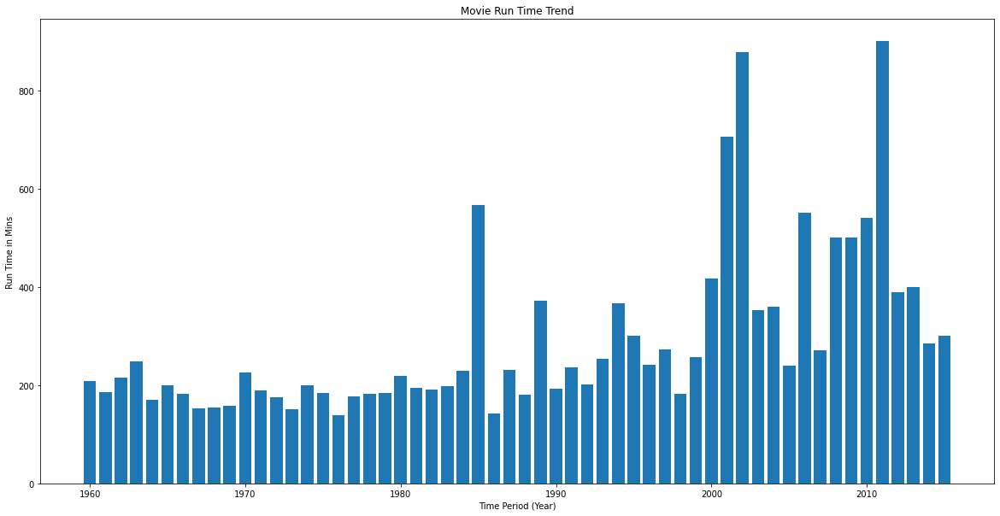

In [13]:
plt.figure(figsize = (20,10))
plt. bar(df['release_year'],df['runtime'])
plt.xlabel('Time Period (Year)')
plt.ylabel('Run Time in Mins')
plt.title('Movie Run Time Trend')

### Revenue VS Time Period Graph Analysis .
  As inffered from Graph below, here are my Analysed points : 


*   An Increase in Revenue tendency can be inferred from the graph below.
*   The Gross mark of 1 Bn. USD is seen to be crossed only after the year 1995, and significant growth is seen overall. 
* Revenue peek is seen in the year : 2010




Text(0.5, 1.0, 'Revenue Trend')

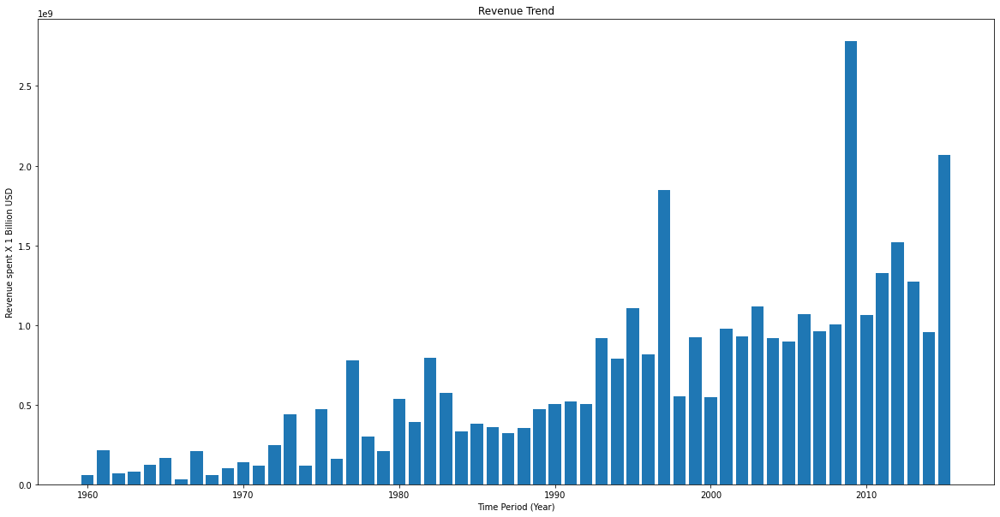

In [14]:
plt.figure(figsize = (20,10))
plt. bar(df['release_year'],df['revenue'])
plt.xlabel('Time Period (Year)')
plt.ylabel('Revenue spent X 1 Billion USD')
plt.title('Revenue Trend')

### Budget VS Time Period Graph Analysis .
  As inffered from Graph below, here are my Analysed points : 


*   An Increase in budget tendency can be inferred from the graph below.
*   The Gross mark of 1 Bn. USD is seen to be crossed only after the year 1995, and significant growth is seen overall. 
* Revenue peek is seen in the year : 2010

Text(0.5, 1.0, 'Budget Trend')

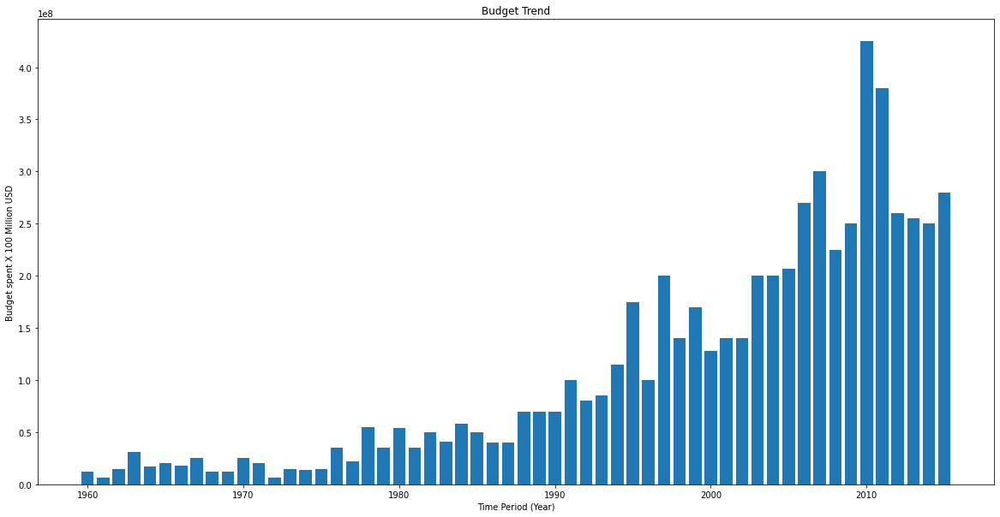

In [75]:
plt.figure(figsize = (20,10))
plt. bar(df['release_year'],df['budget'])
plt.xlabel('Time Period (Year)')
plt.ylabel('Budget spent X 100 Million USD')
plt.title('Budget Trend')

# Conclusion from above Graphs and Analysis :    
 * Both Budget and Revenue Indices have increased over time and share the same increasing tendency.
 * Both Graphs show a spike in the year 2009.
 * Above, two graphs prove our hypothesis about Budget,Revenue Correlation and its nature of being directly proportional on one another. 
 
 (Above given conclusions concern certain exceptions, but share above stated results over all.)

In [18]:
df.head(1)

,id,popularity,budget,revenue,runtime,release_date,vote_count,vote_average,release_year,genre1,genre2,genre3,genre4,genre5,prod1,prod2,prod3,prod4,prod5
0,135397,32.985763,150000000,1513528810,124,6/9/15,5562,6.5,2015,Action,Adventure,Science Fiction,Thriller,None,Universal Studios,Amblin Entertainment,Legendary Pictures,Fuji Television Network,Dentsu


#Now, we will be adressing scenarios based on Genres in the given time period in Database.

### A pie chart inferring, the frequency of genre/genres(overall) with their percentage count in the pie diagram.
### Given below we can find these conclusions : 
* 'Action, Adventure, Crime, Drama, Thriller' have been the most frequent made genre combination for a movie in the given period (1960 - 2015).
* Above genre combination is followed by these 4 genre combination movies : 
  * 'Action, Crime, Drama, Mystery, Thriller'
  * 'Adventure, Animation, Comedy, Family, Fantasy'
  * 'Animation, Adventure, Comedy, Family, Fantasy'
  * 'Action, Adventure, Crime, Drama, Mystery'

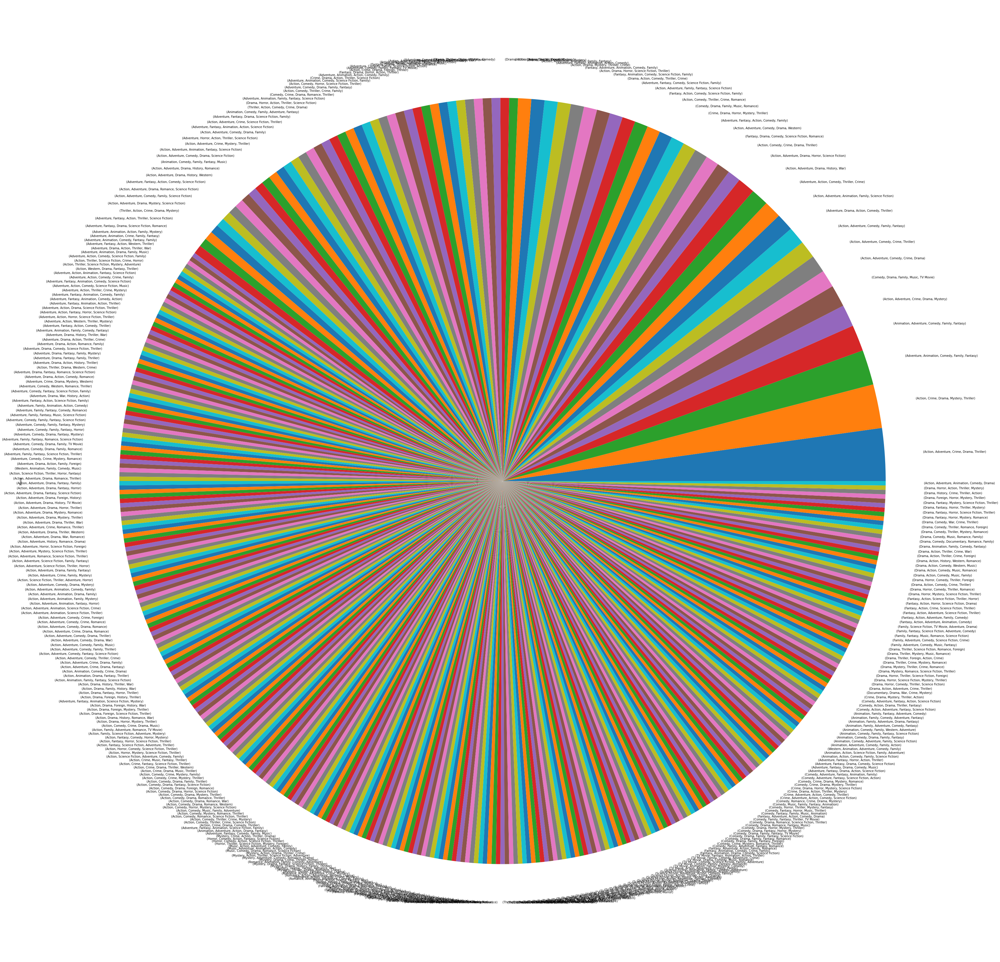

In [16]:
plt.figure(figsize = (60, 60))
df[['genre1','genre2','genre3','genre4','genre5']].value_counts().plot.pie()

## Given Pie charts infer to genres with gross revenue amounts associated.
 * Based on below pie chart indices we can clearly see given 
    'Adventure, Animation, Comedy, Family, Fantasy' genres 
    grossed highest revenue sum through out the periiod.
  

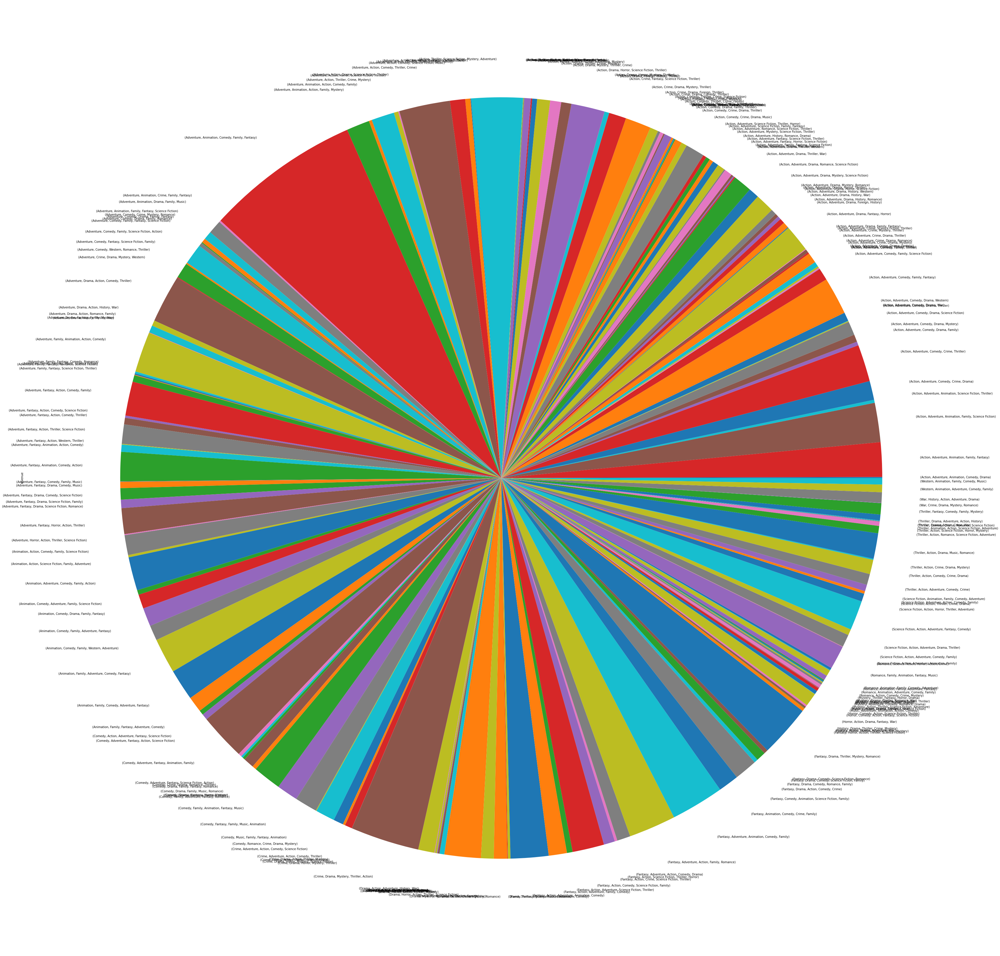

In [23]:
plt.figure(figsize = (60, 60))
df.groupby(['genre1', 'genre2', 'genre3', 'genre4', 'genre5']).revenue.sum().plot.pie()


* Based on below pie chart indices we can clearly see given 
    'Crime, Drama, Mystery, Thriller, Action' genres 
    grossed highest revenue mean through out the periiod.

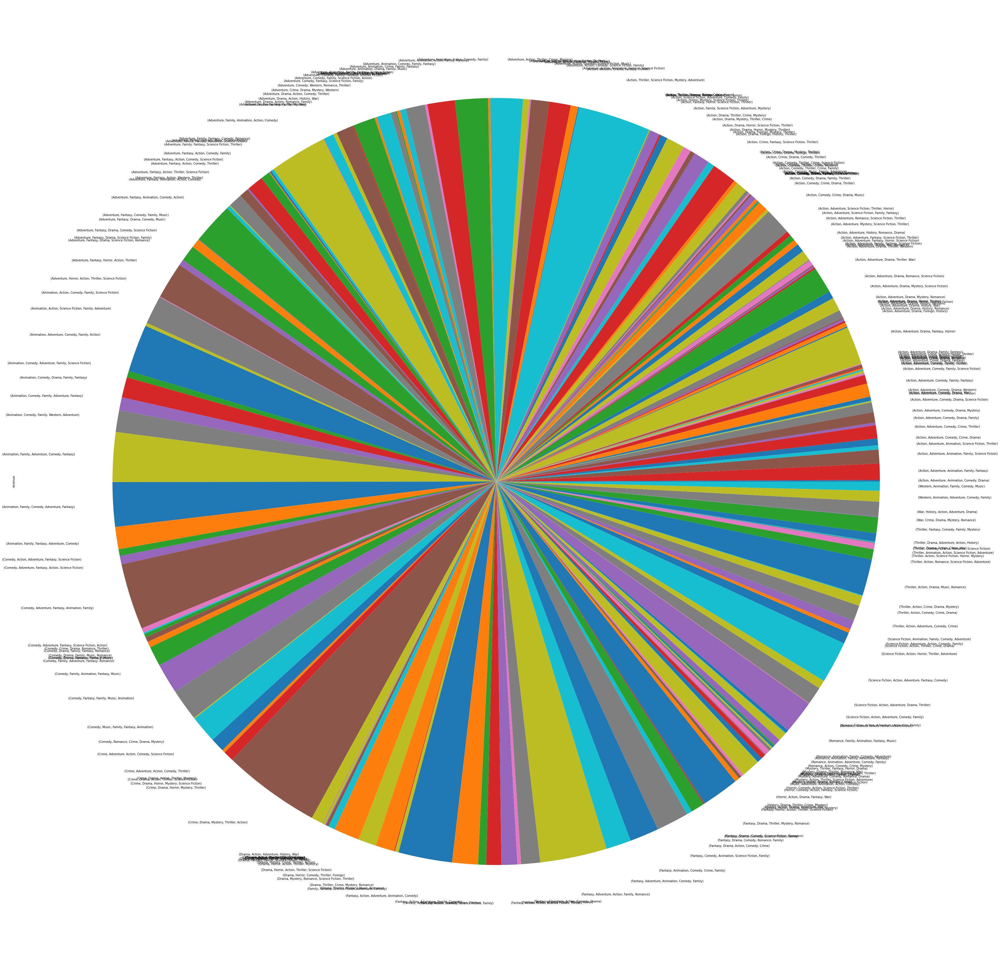

In [24]:
plt.figure(figsize = (60, 60))
df.groupby(['genre1', 'genre2', 'genre3', 'genre4', 'genre5']).revenue.mean().plot.pie()


* Moving ahead, we can see the movie genres per year along with their popularity mean indexed on Y-axis of the below graph.
And we can infer to the most popular movies per year from 1960 to 2015

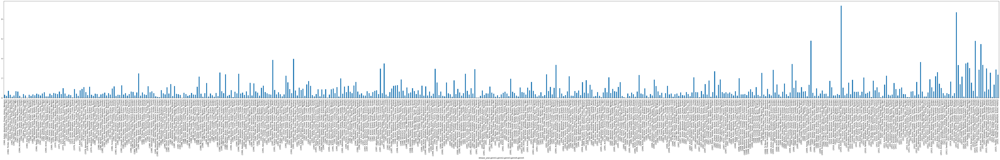

In [74]:
plt.figure(figsize = (60, 10))
df.groupby(['release_year','genre1', 'genre2', 'genre3', 'genre4', 'genre5']).popularity.mean().plot.bar()

* Next, we can find the movies along with their budget means for the movie genres in our database. Further, we can also find maximum mean of the budgets spent per movie genre per year.

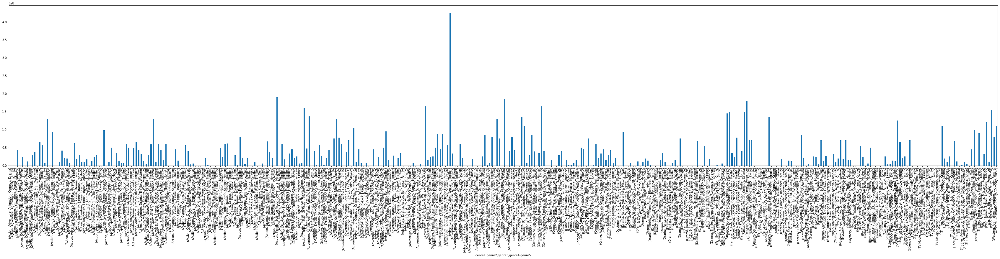

In [50]:
plt.figure(figsize = (60, 10))
df.groupby(['genre1', 'genre2', 'genre3', 'genre4', 'genre5']).budget.mean().plot.bar()

# Conclusion to our Hypothesis.
## Budget and Revenue are positively Correlated and have direct proportional relation between them.

This can finally be verrified using Dataframe.corr() method and checking for correlation between the above two.
Now Since here the value is '0.734901' (which is positive), giving a satisfying conclusion to our hypothesis.

In [59]:
df.corr()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year
id,1.000000,-0.014350,-0.141351,-0.099227,-0.088360,-0.035551,-0.058363,0.511364
popularity,-0.014350,1.000000,0.545472,0.663358,0.139033,0.800828,0.209511,0.089801
budget,-0.141351,0.545472,1.000000,0.734901,0.191283,0.632702,0.081014,0.115931
revenue,-0.099227,0.663358,0.734901,1.000000,0.162838,0.791175,0.172564,0.057048
runtime,-0.088360,0.139033,0.191283,0.162838,1.000000,0.163278,0.156835,-0.117204
vote_count,-0.035551,0.800828,0.632702,0.791175,0.163278,1.000000,0.253823,0.107948
vote_average,-0.058363,0.209511,0.081014,0.172564,0.156835,0.253823,1.000000,-0.117632
release_year,0.511364,0.089801,0.115931,0.057048,-0.117204,0.107948,-0.117632,1.000000


# Sources Reffered :      
 * Stackoverflow.com
 * numpy.org
 * geekforgeeks.org
 * w3schools.com
 * pandas.pydata.com